## Congo Basin shapefile recycling
- running with merged data (zero evap over ocean) and Congo Basin shapefile
- running with rotation options and plotting seasonal averages for all rotations

In [1]:
import numpy as np
import xarray as xr
import pandas as pd
import scipy
import sys 
import warnings
warnings.filterwarnings('ignore')
import geopandas as gpd
from shapely.geometry import mapping
import cartopy.crs as ccrs
import cartopy.feature
import matplotlib.pyplot as plt
import time as timer
start_all = timer.time()

### Read in surface and pressure level files
**Surface file options:**
- S_SE (surface vars including only surface evaporation)
- S_LSE (surface vars including land and surface evaporation)

**Pressure level file options:**
- L_M (pressure level vars resampled to monthly timestep)
- L_HI (pressure level vars with integrated moist flux calcualted hourly and then resampled to monthly timestep)

In [2]:
YR = 2010
dataf ="/Volumes/ESA_F4R/ed_prepare/2026_mergeds/" 
datao ="/Volumes/ESA_F4R/ed_prepare/2026_rho/cb/" 
datap ="/Volumes/ESA_F4R/ed_prepare/2026_plots/cb/" 
datas ="/Users/ellendyer/Library/Mobile Documents/com~apple~CloudDocs/1SHARED_WORK/Work/3_ESA_GRANT/MODEL/Shapefiles/"
shp_cod = gpd.read_file(datas+"congo_basin_evergreen.shp")

S_NAME = "S_SE" # S_SE or S_LSE 
L_NAME = "L_M" # L_M or L_HI

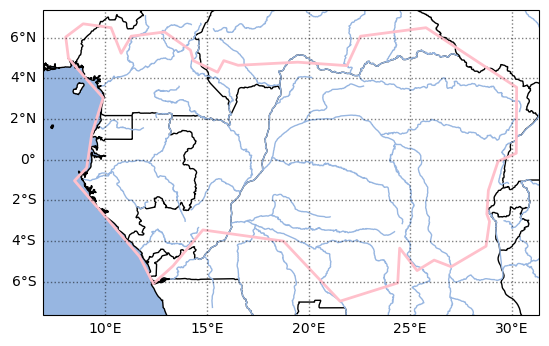

<Figure size 640x480 with 0 Axes>

In [3]:
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS)
ax.add_feature(cartopy.feature.RIVERS)
ax.add_feature(cartopy.feature.OCEAN)
shp_cod.plot(ax=ax, edgecolor='pink',facecolor='none',lw=2,zorder=2,linestyle='-')
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='black', alpha=0.5, linestyle='dotted')
gl.top_labels = False
gl.right_labels = False
plt.show()
plt.clf()

#### **Read in pre-processed files that have the following conversions:**

**Read in ERA5 data on pressure levels**
- resampled to monthly MS timestep
- shum multiplied by 1000 to convert from kg/kg --> g/kg
- pressure levels are divided by 100 to convert from Pa to hPa (only for fortnightly files)
- sort data by descending pressure levels (only for fortnightly files)


**Input file units:**
- plev - pa
- q - kg/kg
- u - m/s
- v - m/s

** ***Might include Fx and Fy if L_HI is being read in***

**Read in ERA5 land and surface data**
- Land: selecting hour 23 (0-23) of Prec and Evap because of how ERA5 Land variables are accumulated (https://confluence.ecmwf.int/pages/viewpage.action?pageId=197702790 - https://confluence.ecmwf.int/display/CKB/ERA5-Land%3A+data+documentation#ERA5Land:datadocumentation-accumulationsAccumulations)
- Surface: evap is accumulated per hour so a daily sum is calculated
- prec is multiplied by 1000 to convert from m to mm
- evap is multiplied by -1000 to convert from m to mm and upward fluxes in land model are considered negative
- Prec, Evap, and Psfc are then resampled to MS monthly and also interpolated to coarser pressure level grid

**Input file units:**
- tp - m (no longer reading in)
- e - m (-)
- sp - pa

**Merging all input datasets into one dataset for recyling code called ds**
- close both input datasets
- sort everything so latitude is south to north
- transpose dimensions so they run (lon,lat,level,time) as in recycling code
- save input ds to file

**Integrate zonal and meridional moisture flux**
- **Must check if there are any nans in input arrays** - there can be none because we are using nans as an indicator in the modified definitions

False
126876
Number of nans in Evap:  0
Number of nans in Psfc:  0
Number of nans in Uwnd:  0
Number of nans in Vwnd:  0
Number of nans in Shum:  0


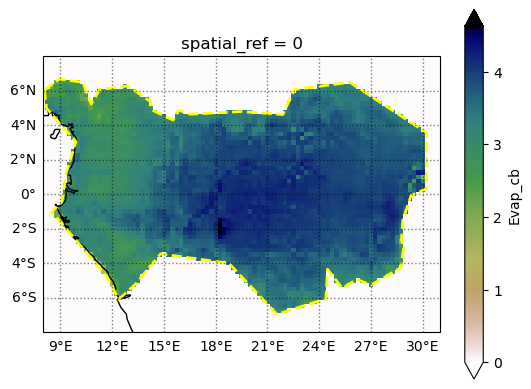

False
72540


<Figure size 640x480 with 0 Axes>

In [4]:
dsS = xr.open_dataset(dataf+"merge_erads_"+S_NAME+"_"+str(YR)+".nc")
dsL = xr.open_dataset(dataf+"merge_erads_"+L_NAME+"_"+str(YR)+".nc")
ds = xr.merge([dsS,dsL])

#Running the code with an irregular boundary means that there will be nans once the data is clipped
#For this to work properly it is important that there are no nans in the input data which would 
#actually be missing data where recycling will be calculated
print(np.isnan(ds['Evap_all'].values).any())
print(ds['Evap_all'].isnull().count().values)
print('Number of nans in Evap: ', ds['Evap_all'].where(np.isnan(ds['Evap_all'])==True,drop=True).count().values)
print('Number of nans in Psfc: ', ds['Psfc'].where(np.isnan(ds['Psfc'])==True,drop=True).count().values)
print('Number of nans in Uwnd: ', ds['Uwnd'].where(np.isnan(ds['Uwnd'])==True,drop=True).count().values)
print('Number of nans in Vwnd: ', ds['Vwnd'].where(np.isnan(ds['Vwnd'])==True,drop=True).count().values)
print('Number of nans in Shum: ', ds['Shum'].where(np.isnan(ds['Shum'])==True,drop=True).count().values)

#Arrange data and prepare it to be clipped by the shapefile
ds = ds.transpose("time","level","lat","lon",missing_dims='ignore')
#ds = ds.rio.set_spatial_dims(x_dim="lon",y_dim="lat")
ds = ds.rename({'lon': 'x','lat': 'y'})
ds.rio.write_crs("epsg:4326", inplace=True)
ds['Evap_cb'] = ds['Evap_all'].rio.clip(shp_cod.geometry.apply(mapping),shp_cod.crs,drop=False)
ds = ds.rename({'x': 'lon','y': 'lat'})
ds['Evap_cb'] = ds['Evap_cb'].fillna(0.0)

ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cartopy.feature.OCEAN)
shp_cod.plot(ax=ax, edgecolor='yellow',facecolor='none',lw=2,zorder=2,linestyle='--')
ds['Evap_cb'].mean('time').plot(ax=ax,transform=ccrs.PlateCarree(),
                                       add_colorbar=True,
                                       #vmin=0,vmax=2,
                                       alpha=1,
                                       cmap=plt.cm.gist_earth_r,
                                       extend="both")

ax.set_extent([8, 31, -8, 8])
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='black', alpha=0.5, linestyle='dotted')
gl.top_labels = False
gl.right_labels = False
#ax.set_title()
#plt.savefig()
plt.show()
plt.clf()
          
#Points that are 0.0 are inside the region, points on the boundary will be
ds = ds.transpose("lon","lat","level","time",missing_dims='ignore')

ds = ds.sel(lon=slice(7,31),lat=slice(-8,8))

print(np.isnan(ds['Evap_cb'].values).any())
print(ds['Evap_cb'].isnull().count().values)

In [5]:
if L_NAME=='L_HI':
    Fx = ds['Fx']
    Fy = ds['Fy']
else:
    #Prepping datasets near surface for recycling
    import bulk_recycling_model.numerical_integration
    
    # Integrate 10^-3 Shum Uwnd dp
    # Because the integration limits are from high pressure to low pressure, we need to invert the sign.
    integrand = -1 * 1e-3 * ds["Shum"] * ds["Uwnd"]
    Fx = bulk_recycling_model.numerical_integration.integrate_with_extrapolation(integrand, ds["Psfc"])
    # Units: mb x m/s
    
    # Integrate 10^-3 Shum Vwnd dp
    # Because the integration limits are from high pressure to low pressure, we need to invert the sign.
    integrand = -1 * 1e-3 * ds["Shum"] * ds["Vwnd"]
    Fy = bulk_recycling_model.numerical_integration.integrate_with_extrapolation(integrand, ds["Psfc"])
    # Units: mb x m/s


**Prepare scaled data for recycling code**
- Evaporation and moisture fluxes


In [6]:
# Prepare and scale the data
from bulk_recycling_model import preprocess
from bulk_recycling_model import ED_preprocess
from bulk_recycling_model.axis import Axis
from bulk_recycling_model.scaling import Scaling, UnitSystem

# degrees
L = ds.coords["lon"].max().item() - ds.coords["lon"].min().item()
# convert to meters
L = L * 111e3 * np.cos(np.deg2rad(ds.coords["lat"].mean().item()))
dx = L / ds.sizes["lon"]

# lon axis
lon_axis = Axis(
    ds.coords["lon"].min().item(),
    ds.coords["lon"].diff("lon").mean().item(),
    ds.sizes["lon"],
)

# degrees
H = ds.coords["lat"].values[-1] - ds.coords["lat"].values[0]
# convert to meters
H = H * 111e3
dy = H / ds.sizes["lat"]

# lat axis
lat_axis = Axis(
    ds.coords["lat"].min().item(),
    ds.coords["lat"].diff("lat").mean().item(),
    ds.sizes["lat"],
)

print(f"{L = :.2e} m")
print(f"{dx = :.2e} m")
print(f"{H = :.2e} m")
print(f"{dy = :.2e} m")

# make a scaling object to convert between unit systems
scaling = Scaling(H)

dx = scaling.distance.convert(dx, UnitSystem.SI, UnitSystem.scaled)
dy = scaling.distance.convert(dy, UnitSystem.SI, UnitSystem.scaled)
print(f"{dx = :.2e} scaled")
print(f"{dy = :.2e} scaled")

# convert Fx and Fy to scaled units
Fx = scaling.water_vapor_flux.convert(Fx.values, UnitSystem.natural, UnitSystem.scaled)
Fy = scaling.water_vapor_flux.convert(Fy.values, UnitSystem.natural, UnitSystem.scaled)

# convert E to scaled units
# Do this for both the total E and the local regionally clipped E]
#print('pre-scaled',ds['Evap'])
E_total = scaling.evaporation.convert(ds["Evap_all"].values, UnitSystem.natural, UnitSystem.scaled)
E_local = scaling.evaporation.convert(ds["Evap_cb"].values, UnitSystem.natural, UnitSystem.scaled)

L = 2.55e+06 m
dx = 2.75e+04 m
H = 1.78e+06 m
dy = 2.73e+04 m
dx = 1.55e-02 scaled
dy = 1.54e-02 scaled


**Plot the scaled E array**


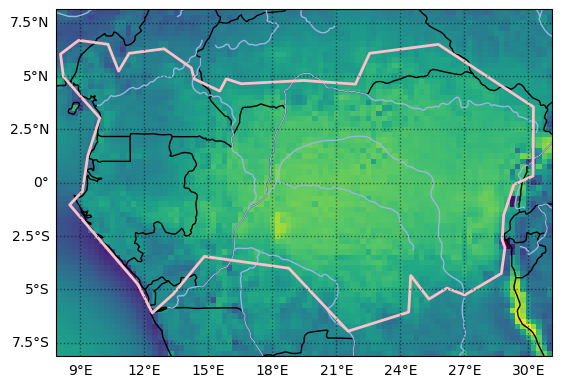

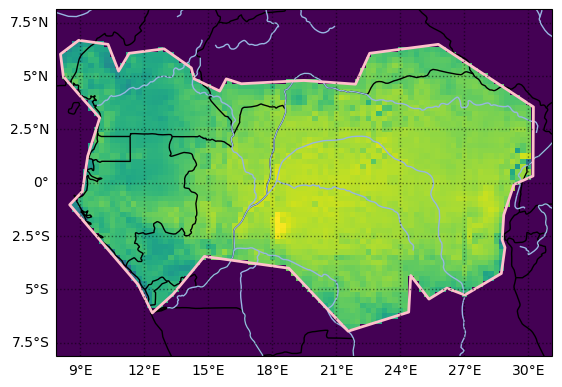

<Figure size 640x480 with 0 Axes>

In [7]:
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS)
ax.add_feature(cartopy.feature.RIVERS)
ax.add_feature(cartopy.feature.OCEAN)
#Overlay with all ward outline
shp_cod.plot(ax=ax, edgecolor='pink',facecolor='none',lw=2,zorder=2,linestyle='-')
#Plot data
Ea = np.transpose(np.average(E_total,axis=2))
collection = plt.pcolormesh(ds.lon, ds.lat,Ea)
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='black', alpha=0.5, linestyle='dotted')
gl.top_labels = False
gl.right_labels = False
#ax.set_title()
#plt.savefig()
plt.show()
plt.clf()

ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS)
ax.add_feature(cartopy.feature.RIVERS)
ax.add_feature(cartopy.feature.OCEAN)
#Overlay with all ward outline
shp_cod.plot(ax=ax, edgecolor='pink',facecolor='none',lw=2,zorder=2,linestyle='-')
#Plot data
Ea = np.transpose(np.average(E_local,axis=2))
collection = plt.pcolormesh(ds.lon, ds.lat,Ea)
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='black', alpha=0.5, linestyle='dotted')
gl.top_labels = False
gl.right_labels = False
#ax.set_title()
#plt.savefig()
plt.show()
plt.clf()

**Run recycling model for each timestep**
- Create recycling output array based on the shape of one of the surface input files: evap 
- Translate evap and fluxes to secondary grid
- Calculate modeled precipitation
- Plot scaled input variables (evap and fluxes)
- Run through each timestep in the input files and calculate recycling ratio at each timestep across domain
- Plot rho and convergence metric for each timestep

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 308 iterations and 0:00:05.095122
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 299 iterations and 0:00:04.653752
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 242 iterations and 0:00:03.903734
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 257 iterations and 0:00:04.268732


0 2010-01-01T00:00:00.000000000
Rotation is:  3
242


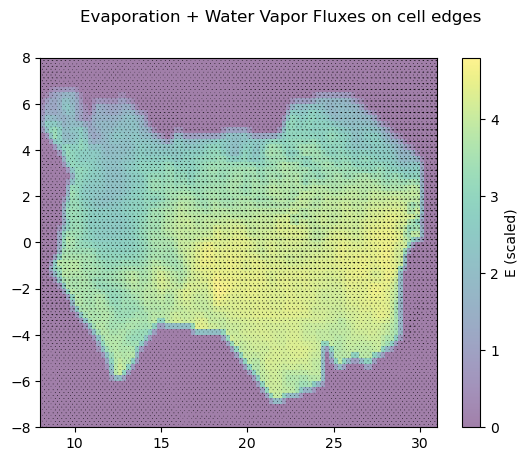

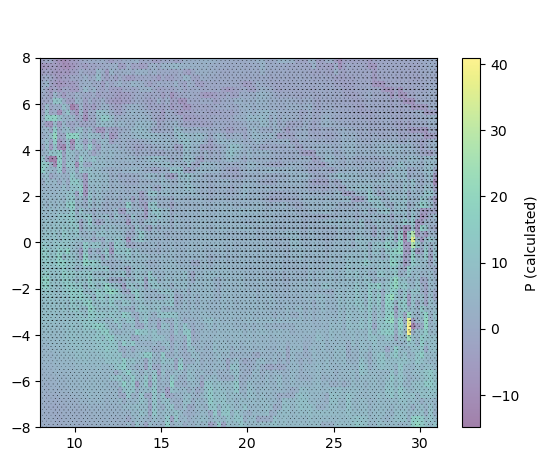

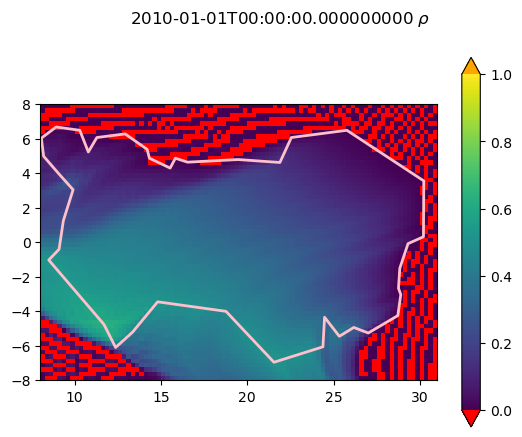

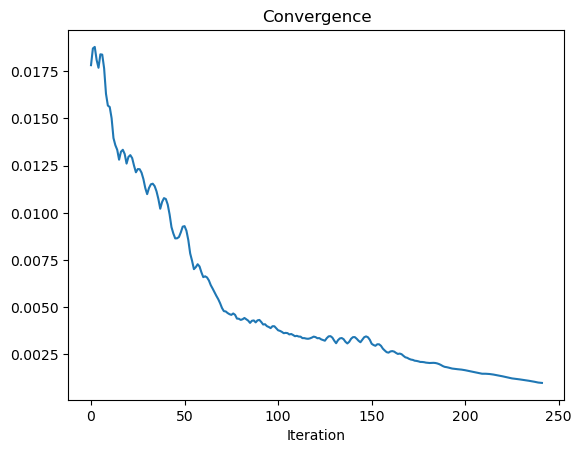

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 438 iterations and 0:00:07.394907
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees


1 2010-02-01T00:00:00.000000000
Rotation is:  3
500


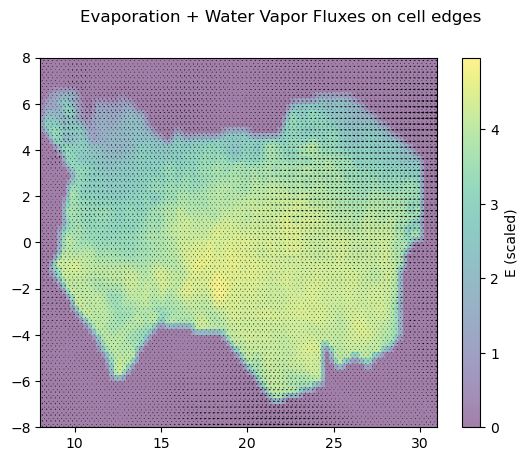

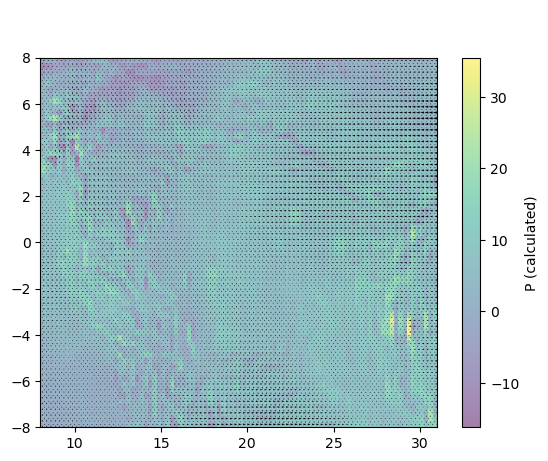

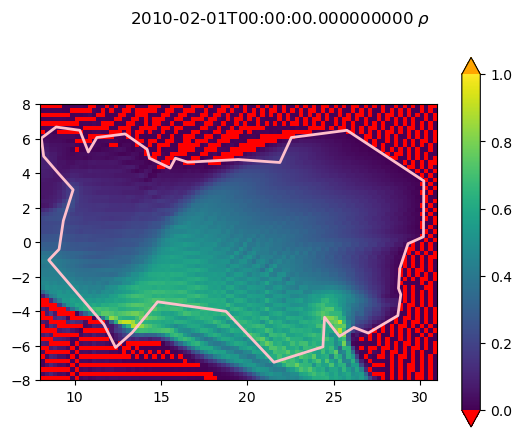

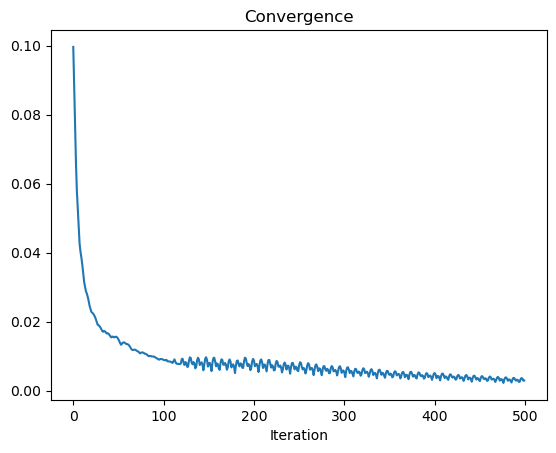

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 299 iterations and 0:00:04.901041
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 292 iterations and 0:00:04.520108
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 218 iterations and 0:00:03.438925
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 230 iterations and 0:00:03.595416


2 2010-03-01T00:00:00.000000000
Rotation is:  3
218


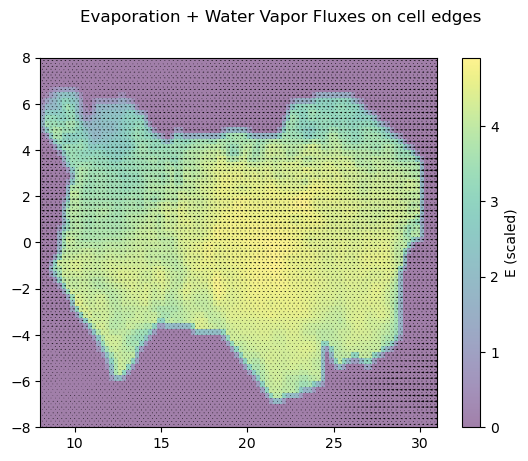

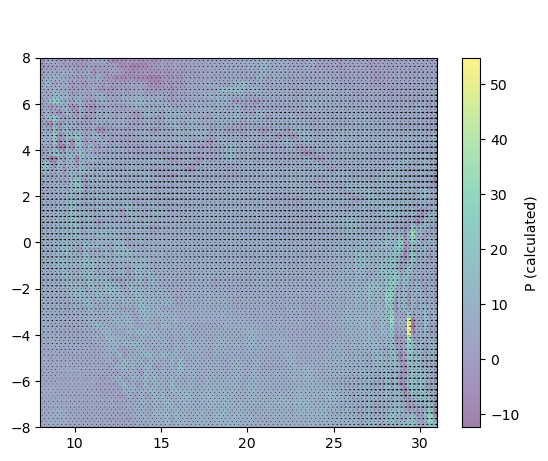

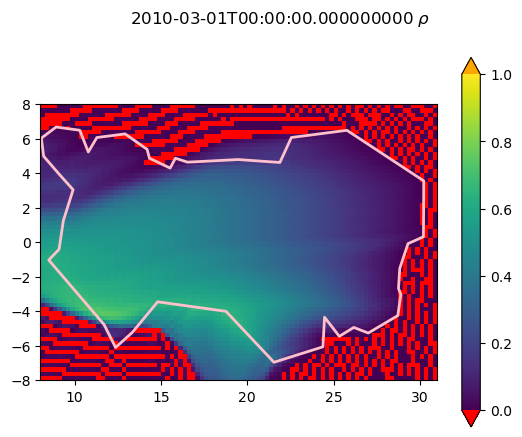

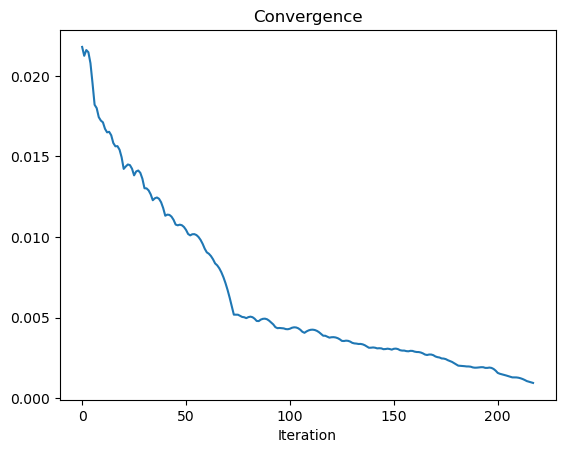

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 278 iterations and 0:00:04.584417
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 285 iterations and 0:00:04.505412
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 206 iterations and 0:00:03.335127
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 198 iterations and 0:00:03.053865


3 2010-04-01T00:00:00.000000000
Rotation is:  3
206


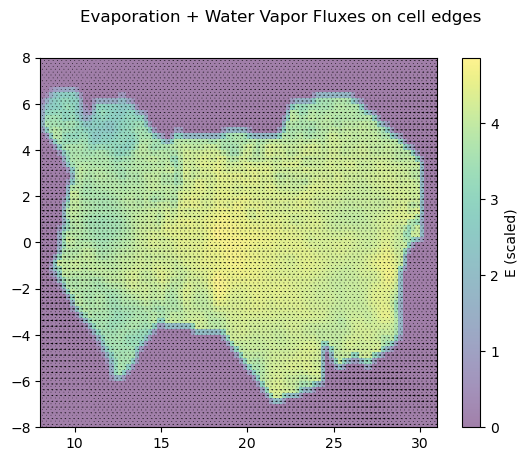

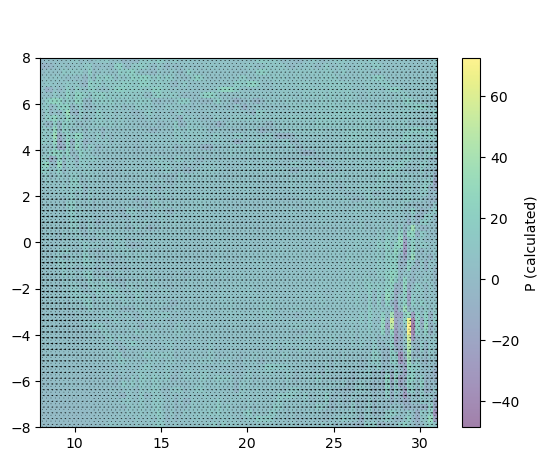

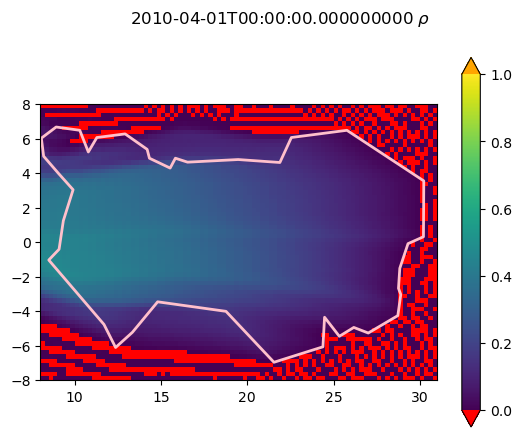

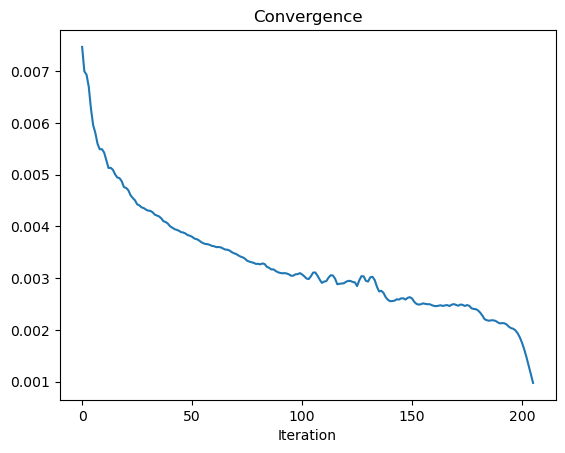

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 306 iterations and 0:00:04.876019
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 331 iterations and 0:00:05.136363
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 254 iterations and 0:00:04.038290
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 229 iterations and 0:00:03.579682


4 2010-05-01T00:00:00.000000000
Rotation is:  3
254


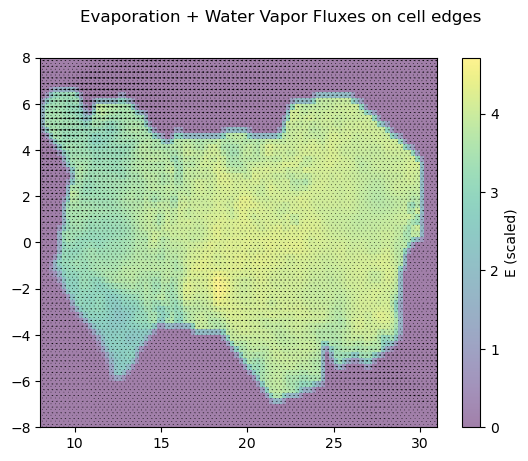

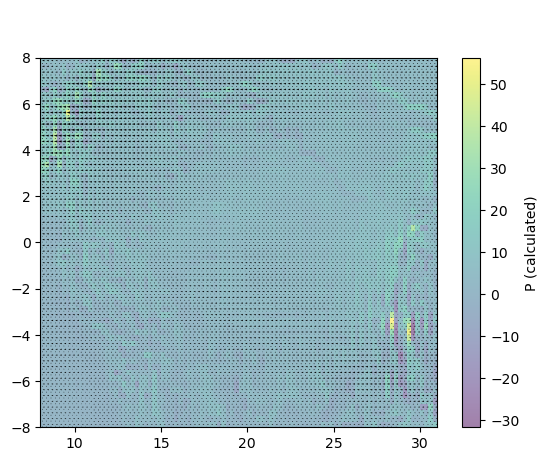

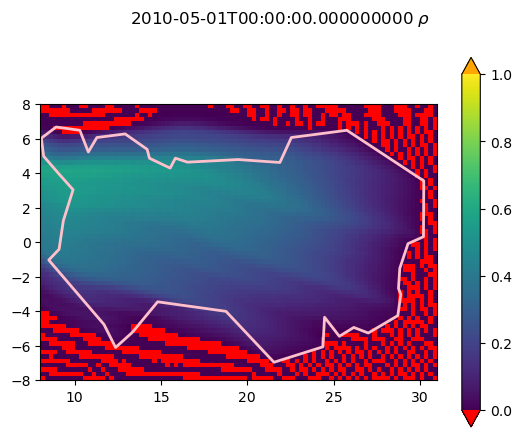

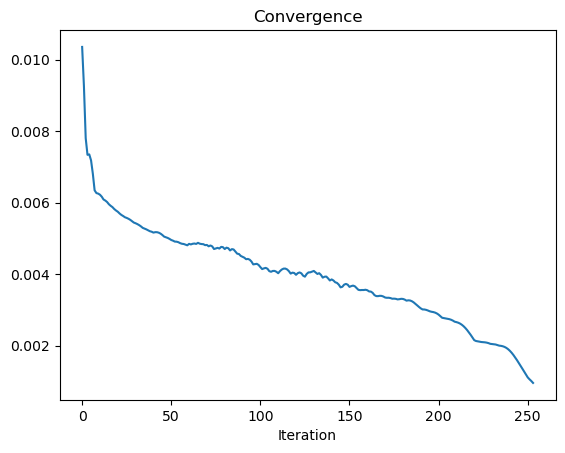

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 312 iterations and 0:00:04.908387
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 337 iterations and 0:00:05.226387
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 260 iterations and 0:00:04.154195
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 234 iterations and 0:00:03.634608


5 2010-06-01T00:00:00.000000000
Rotation is:  3
260


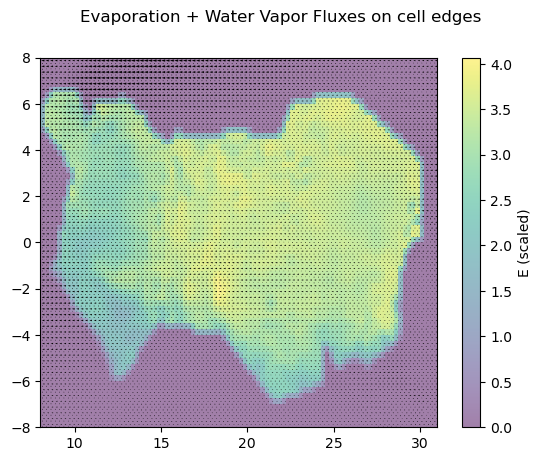

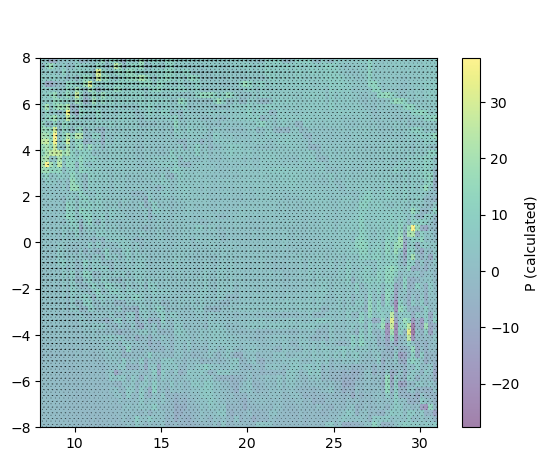

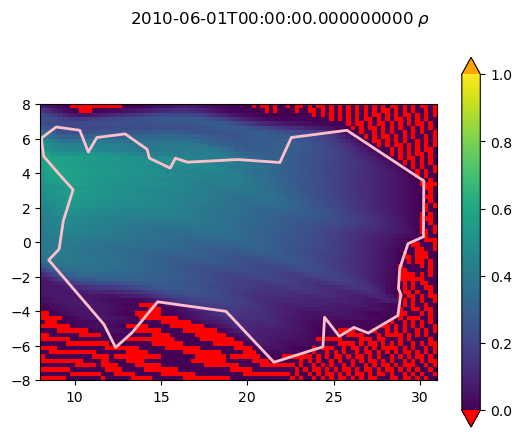

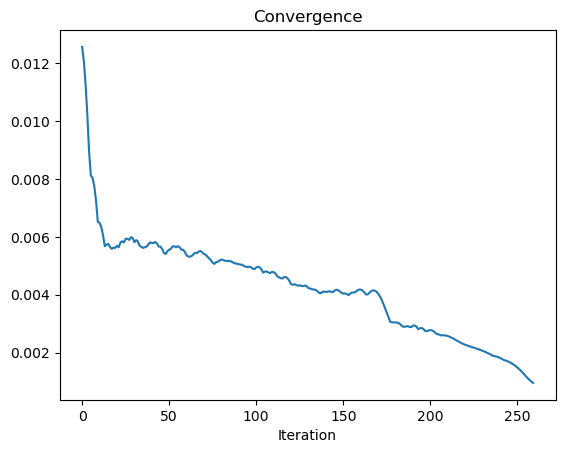

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 233 iterations and 0:00:03.680035
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 274 iterations and 0:00:04.276772
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 255 iterations and 0:00:04.074496
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 223 iterations and 0:00:03.489653


6 2010-07-01T00:00:00.000000000
Rotation is:  3
255


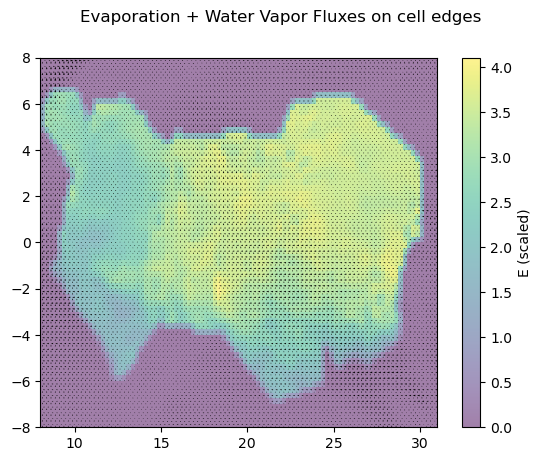

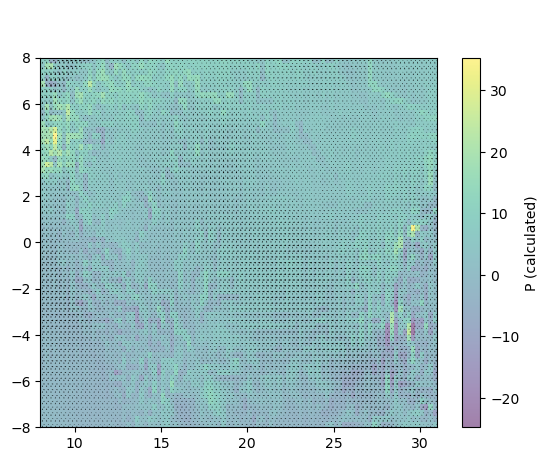

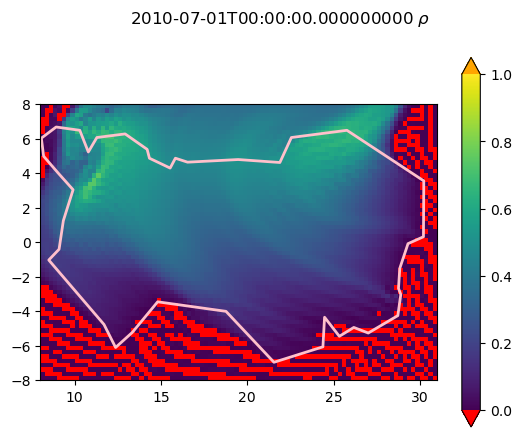

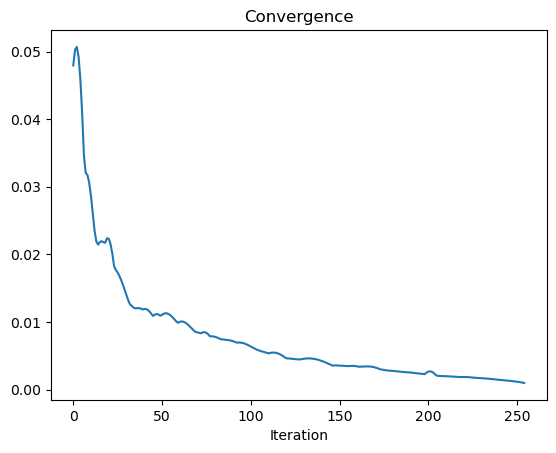

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 259 iterations and 0:00:04.929409
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 284 iterations and 0:00:04.527137
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 287 iterations and 0:00:04.602349
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 278 iterations and 0:00:04.341811


7 2010-08-01T00:00:00.000000000
Rotation is:  3
287


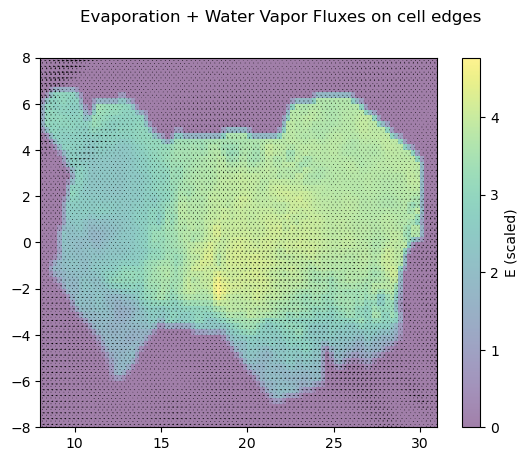

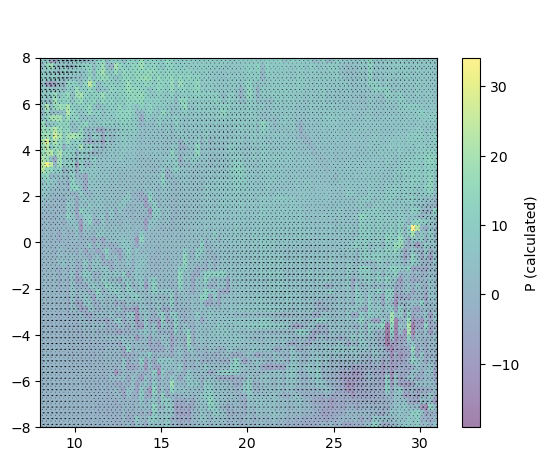

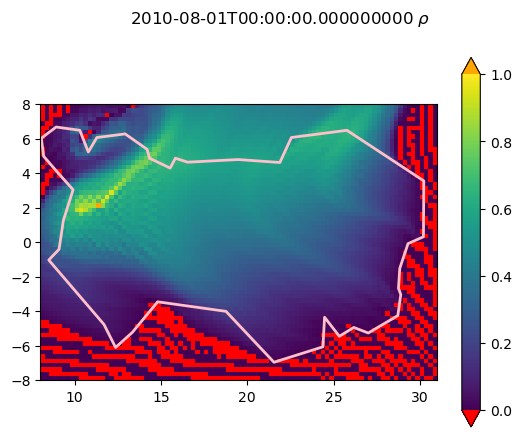

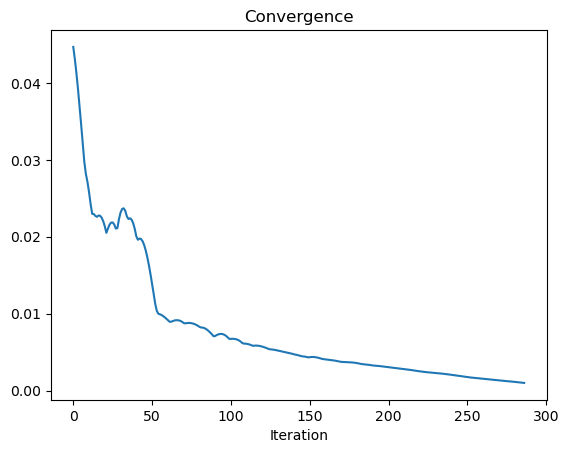

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 330 iterations and 0:00:05.529576
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 350 iterations and 0:00:06.162649
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 314 iterations and 0:00:05.002058
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 288 iterations and 0:00:04.507639


8 2010-09-01T00:00:00.000000000
Rotation is:  3
314


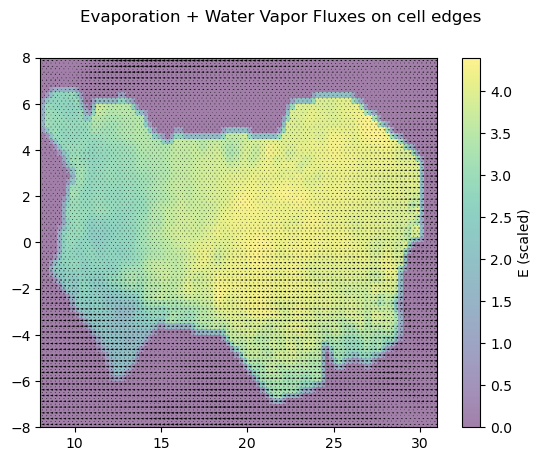

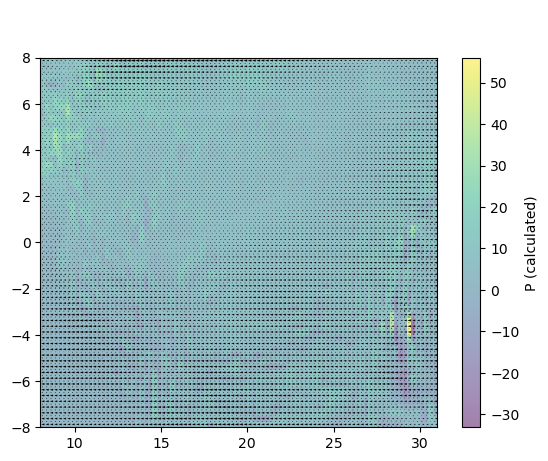

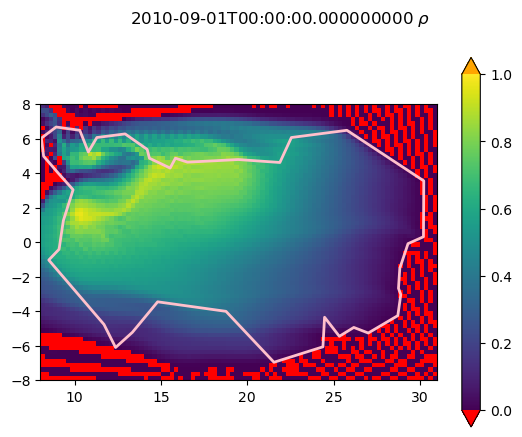

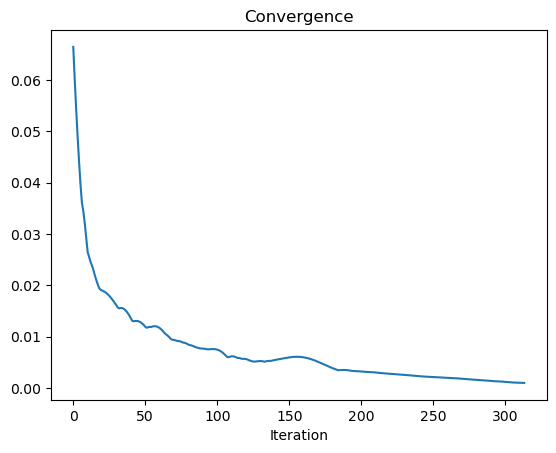

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 310 iterations and 0:00:05.003504
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 311 iterations and 0:00:05.061187
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 246 iterations and 0:00:03.863574
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 234 iterations and 0:00:03.693866


9 2010-10-01T00:00:00.000000000
Rotation is:  3
246


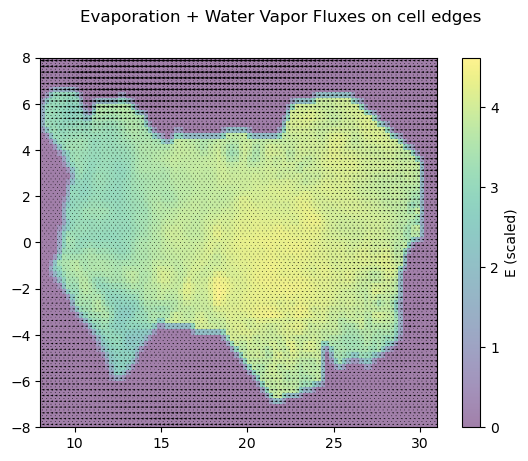

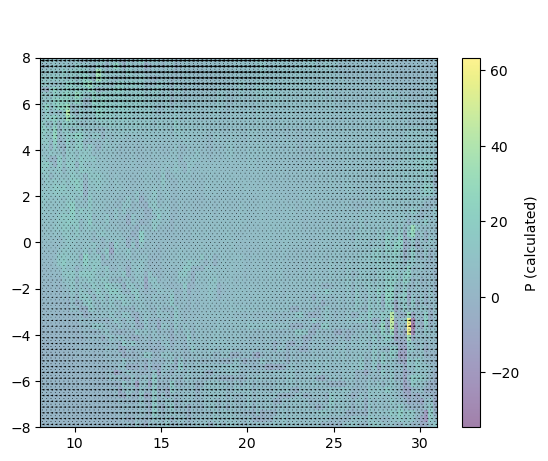

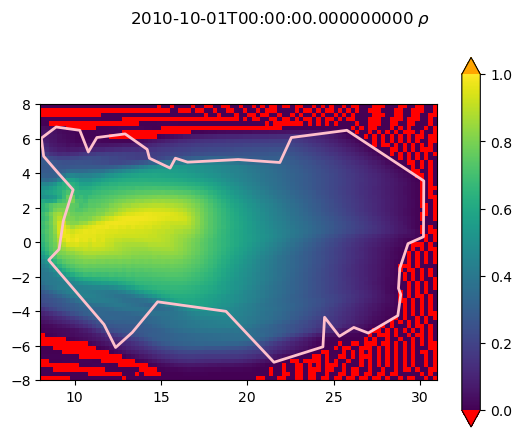

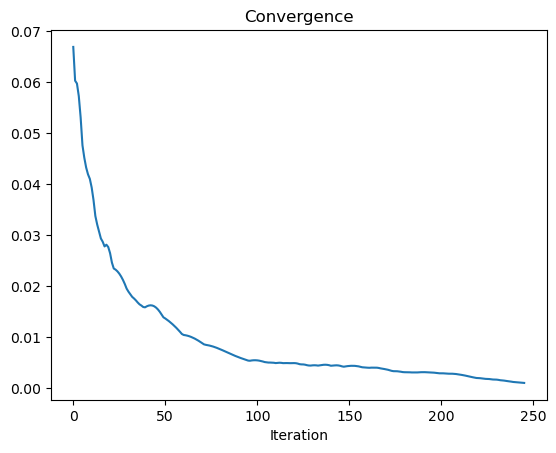

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 321 iterations and 0:00:05.146799
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 302 iterations and 0:00:04.723226
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 238 iterations and 0:00:03.775837
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 243 iterations and 0:00:03.915124


10 2010-11-01T00:00:00.000000000
Rotation is:  3
238


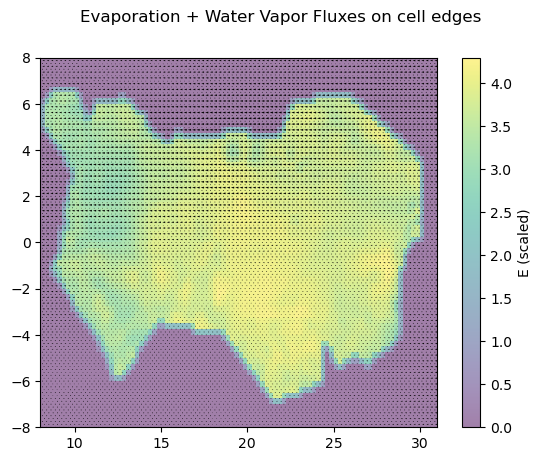

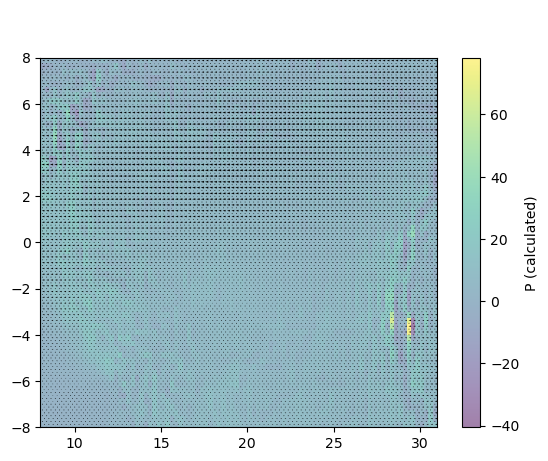

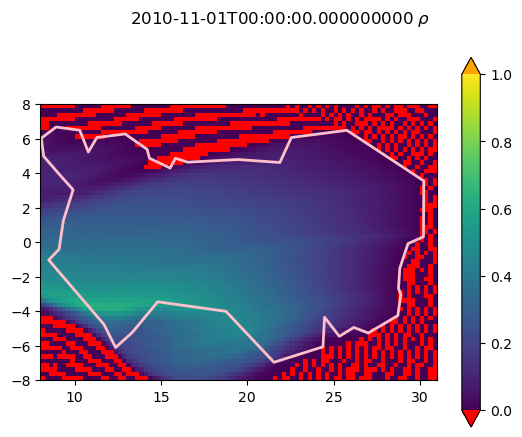

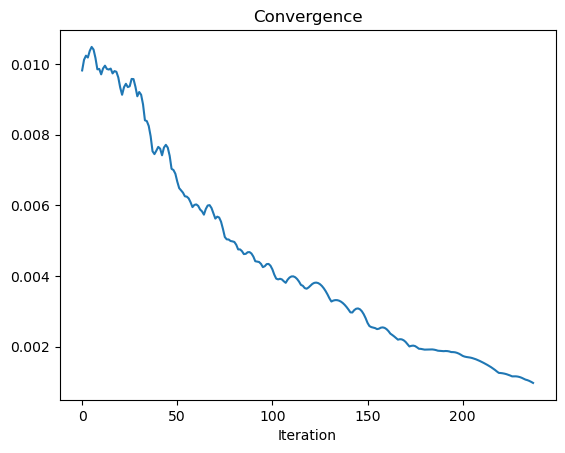

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 326 iterations and 0:00:05.245332
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 300 iterations and 0:00:04.693183
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 243 iterations and 0:00:03.923846
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 269 iterations and 0:00:04.263621


11 2010-12-01T00:00:00.000000000
Rotation is:  3
243


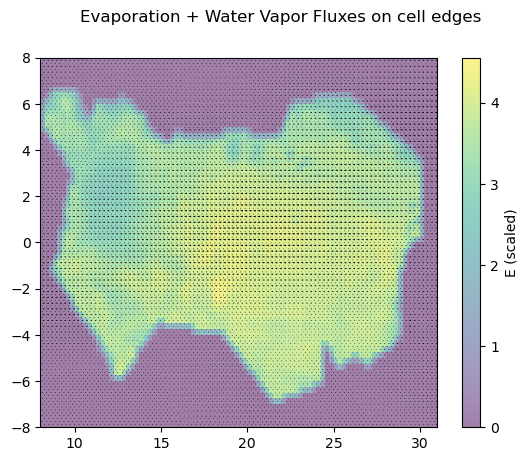

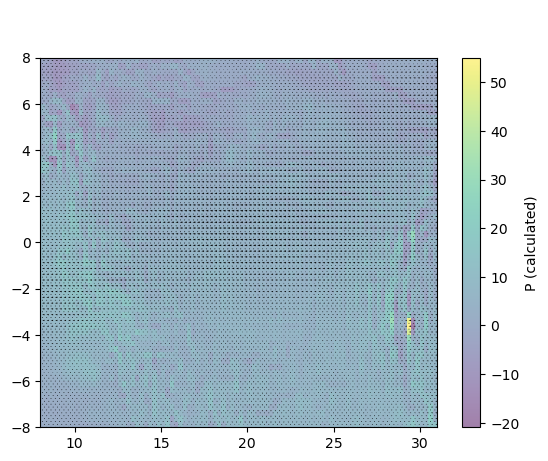

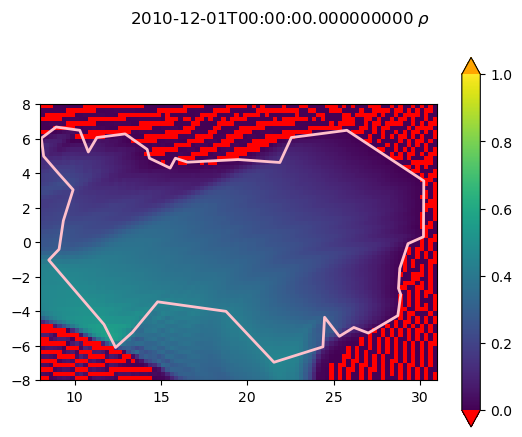

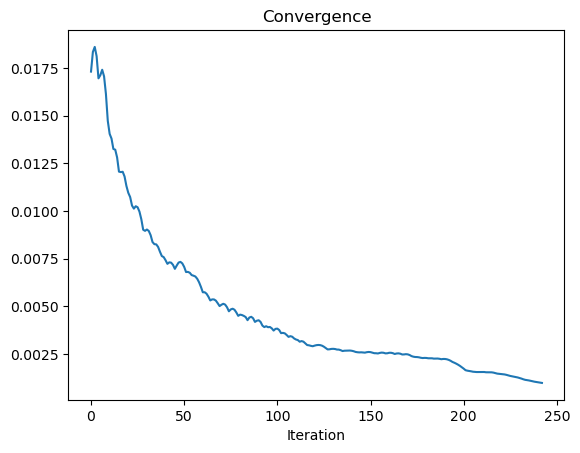

In [ ]:
import matplotlib.pyplot as plt
import logging
logging.basicConfig()
logging.getLogger("bulk_recycling_model").setLevel(logging.INFO)
from bulk_recycling_model import plotting
from bulk_recycling_model.main import run_4_orientations

#Make the rho array the same shape as the total E - will clip the external points at the end
rho_ar = np.empty((4,np.shape(E_total)[0]-1,np.shape(E_total)[1]-1,np.shape(E_total)[2]))
#Entering preprocessing and time step loop
#Run model and plot
for i,time in enumerate(ds.time):
     
    # preprocess E onto the secondary grid
    Ei_total = ED_preprocess.prepare_E(E_total[:,:,i])
    Ei_local = ED_preprocess.prepare_E(E_local[:,:,i])
    
    # preprocess water vapor fluxes onto the secondary grid
    Fxi_left = preprocess.prepare_Fx_left(Fx[:,:,i])
    Fxi_right = preprocess.prepare_Fx_right(Fx[:,:,i])
    Fyi_bottom = preprocess.prepare_Fy_bottom(Fy[:,:,i])
    Fyi_top = preprocess.prepare_Fy_top(Fy[:,:,i])
    
    # compute P
    Pi = preprocess.calculate_precipitation(Fxi_left, Fxi_right, Fyi_bottom, Fyi_top, Ei_total, dx, dy)

    # Create a quiver plot
    fig, ax = plt.subplots()
    collection = plotting.pcolormesh(ax, Ei_local, lon_axis, lat_axis, alpha=0.5)
    fig.colorbar(collection, label="E (scaled)")
    plotting.quiver(ax, Fxi_left, Fxi_right, Fyi_bottom, Fyi_top, lon_axis, lat_axis)
    fig.suptitle("Evaporation + Water Vapor Fluxes on cell edges")
    
    # Create a precip plot
    fig, ax = plt.subplots()
    collection = plotting.pcolormesh(ax, Pi, lon_axis, lat_axis, alpha=0.5)
    fig.colorbar(collection, label="P (calculated)")
    plotting.quiver(ax, Fxi_left, Fxi_right, Fyi_bottom, Fyi_top, lon_axis, lat_axis)
    fig.suptitle(" ")
    
    # Run the model
    status = run_4_orientations(
        Fxi_left,
        Fxi_right,
        Fyi_bottom,
        Fyi_top,
        Ei_local,
        Pi,
        dx,
        dy,
        R=0.2,
        R_1=0.2,
        max_iter=1000,
        tol=1e-3,
    )
    
    #Print timestep and status (converged or not) and add rho to recycling ration array
    print(i,time.values)
    for R in np.arange(0,4):
        print(R,status[R]['success'])    
    if status[R]['success']==True:
        rho_ar[R,:,:,i] = status[R]["rho"]
    else:
        rho_ar[R,:,:,i] = np.nan

        # plot each timestep 
        fig, ax = plt.subplots()
        cmap=plt.cm.viridis
        cmap.set_extremes(under='red', over='orange')
        collection = plotting.pcolormesh(ax, status[R]["rho"], lon_axis, lat_axis,
                                      vmin=0.0, vmax=1,
                                      cmap=cmap)
        fig.colorbar(collection,extend='both')
        fig.suptitle("Rot: "+str(R)+' - '+str(time.values)+" $\\rho$")
        #plt.savefig(datap+"rho_"+str(time.values)+".png")
        plt.show()
        plt.close()
     
        # plot the convergence
        deltas = status[R]["deltas"]
        fig, ax = plt.subplots()
        ax.plot(deltas)
        ax.set_title("Rot: "+str(R)+" - Convergence")
        ax.set_xlabel("Iteration")
        plt.show()
        plt.close() 

**Create and save rho xarray file**

- Create an xarray to store all of the calculated recycling ratios that is organised in an easy to plot/interpret format
- Count number of values in array over 1 - replace all of these with 1
- Count number of negative rho values - replace all of these with zero
- Save to file

In [9]:
lon_ar = np.linspace(start=ds.coords["lon"].min().values+lon_axis.step/2,
                     stop=ds.coords["lon"].max().values-lon_axis.step/2,
                     num=lon_axis.n_points-1)
lat_ar = np.linspace(start=ds.coords["lat"].min().values+lat_axis.step/2,
                     stop=ds.coords["lat"].max().values-lat_axis.step/2,
                     num=lat_axis.n_points-1)
rho_xarr = xr.Dataset(
    data_vars=dict(rho=(["rot","lon","lat","time"],rho_ar)),
    coords=dict(
        rot=(["rot"],[1,2,3,4]),
        lon=(["lon"], lon_ar),
        lat=(["lat"], lat_ar),
        time=(["time"],ds.time.data)
    ),
    attrs=dict(
        description="Recycling ratio",
        units="%",
    ),
) 
rho_xarr = rho_xarr.transpose("rot","time","lat","lon")
rho_xarr = rho_xarr.rio.set_spatial_dims(x_dim="lon",y_dim="lat")
rho_xarr.rio.write_crs("epsg:4326", inplace=True)
rho_xarr = rho_xarr.rio.clip(shp_cod.geometry.apply(mapping),shp_cod.crs,drop=False)
rho_xarr.to_netcdf(datao+L_NAME+"_"+S_NAME+"_cb_rot_rho_era5_"+str(YR)+".nc")

In [10]:
#Filtering out outliers for plotting 
for r in np.arange(1,5):
    print("*** Rotation is: ",r)
    print('Number of rhos over 1: ', rho_xarr['rho'][r-1,:,:,:].where(rho_xarr['rho'][r-1,:,:,:].values>1.0).count().values)
    print('Number of negative rhos: ', rho_xarr['rho'][r-1,:,:,:].where(rho_xarr['rho'][r-1,:,:,:].values<0.0).count().values)
    rho_xarr['rho'][r-1,:,:,:] = rho_xarr['rho'][r-1,:,:,:].where(rho_xarr['rho'][r-1,:,:,:].values<=1.0,1.0)
    rho_xarr['rho'][r-1,:,:,:] = rho_xarr['rho'][r-1,:,:,:].where(rho_xarr['rho'][r-1,:,:,:].values>0.0,0.0)
    print('Number of rhos over 1: ', rho_xarr['rho'][r-1,:,:,:].where(rho_xarr['rho'][r-1,:,:,:].values>1.0).count().values)
    print('Number of negative rhos: ', rho_xarr['rho'][r-1,:,:,:].where(rho_xarr['rho'][r-1,:,:,:].values<0.0).count().values)
    print('-------------------------')
end_all = timer.time()
length = end_all - start_all
print("Running the whole prep and recycling code took ", length, "seconds")


*** Rotation is:  1
Number of rhos over 1:  0
Number of negative rhos:  262
Number of rhos over 1:  0
Number of negative rhos:  0
-------------------------
*** Rotation is:  2
Number of rhos over 1:  0
Number of negative rhos:  260
Number of rhos over 1:  0
Number of negative rhos:  0
-------------------------
*** Rotation is:  3
Number of rhos over 1:  1
Number of negative rhos:  258
Number of rhos over 1:  0
Number of negative rhos:  0
-------------------------
*** Rotation is:  4
Number of rhos over 1:  1
Number of negative rhos:  253
Number of rhos over 1:  0
Number of negative rhos:  0
-------------------------
Running the whole prep and recycling code took  245.4014971256256 seconds


**Plotting**

Create seasonal arrays and plot these

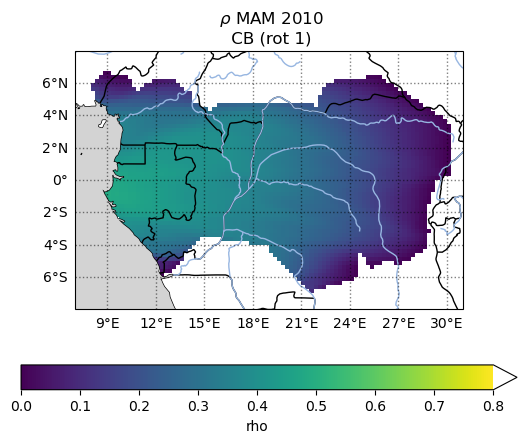

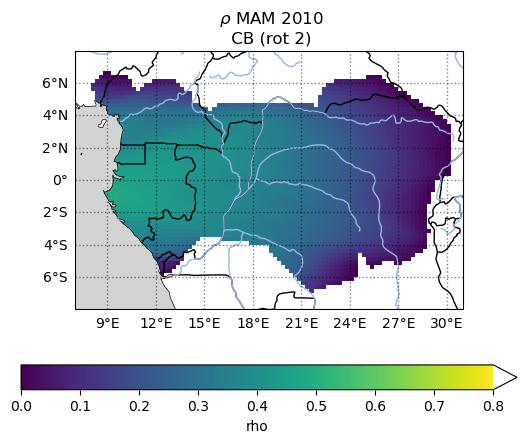

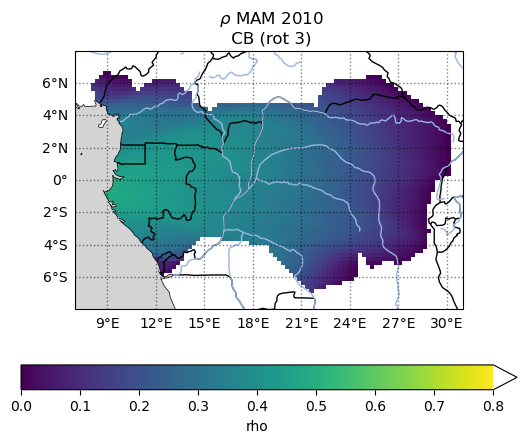

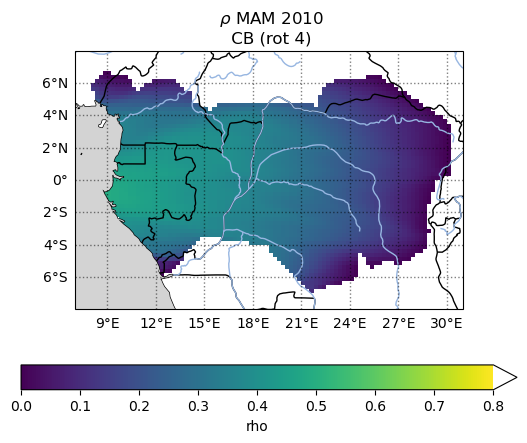

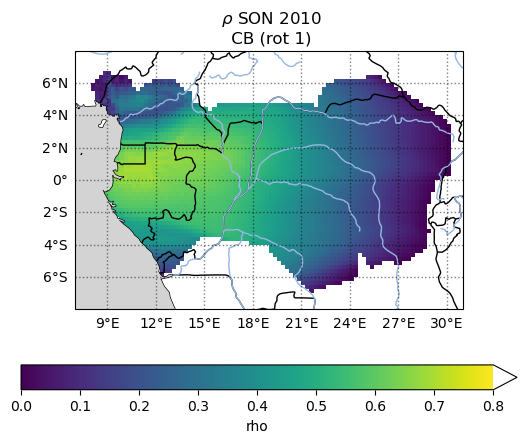

...

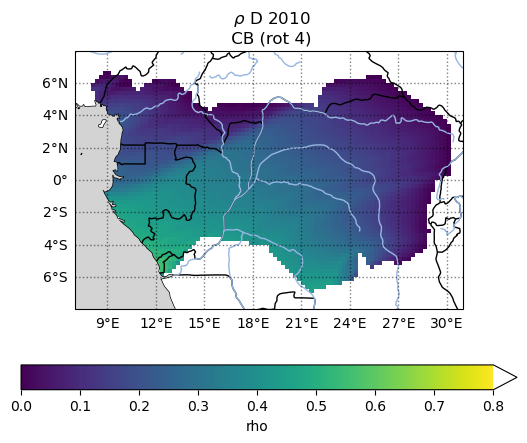

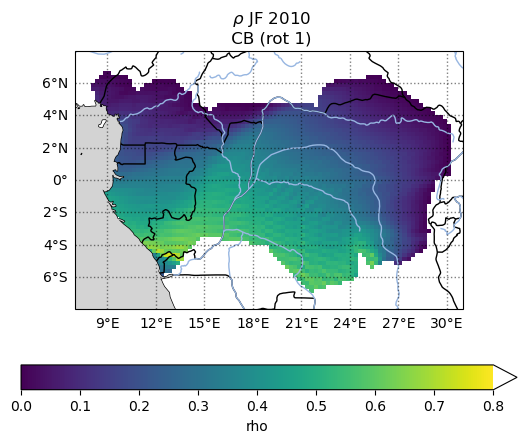

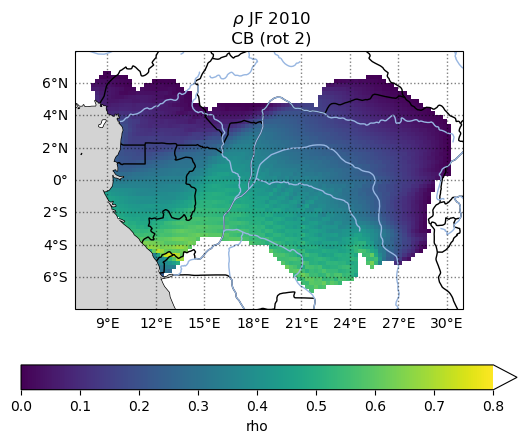

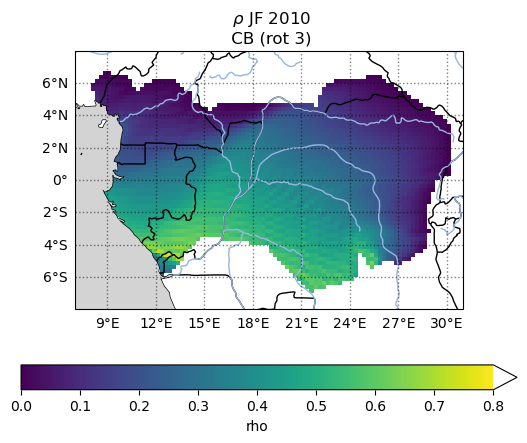

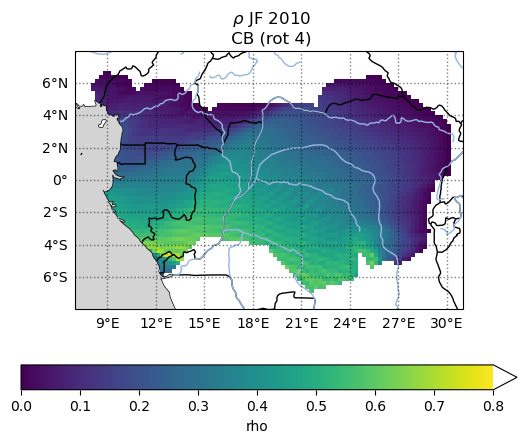

In [11]:
# Create seasonal arrays and plot these
seas={'MAM':[3,4,5],'SON':[9,10,11],'JJA':[6,7,8],'D':[12],'JF':[1,2]}
for S in seas:
    for r in np.arange(1,5):
        rho_plot = rho_xarr['rho'][r-1,:,:,:] 
        seas_rho = rho_plot.sel(time=rho_xarr.time.dt.month.isin(seas[S]))
        fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
        ax.coastlines()
        ax.add_feature(cartopy.feature.BORDERS)
        ax.add_feature(cartopy.feature.RIVERS)
        ax.add_feature(cartopy.feature.OCEAN,zorder=2,facecolor='lightgrey')
        cmap=plt.cm.viridis
        cmap.set_extremes(over='white')
        collection = seas_rho.mean("time").plot.pcolormesh(vmin=0.0,vmax=0.8,
                                                        #levels=13,
                                                        ax=ax,extend='max',cmap=cmap,
                                                        cbar_kwargs={"location":"bottom"} )
        ax.set_extent([7, 31, -8, 8])
        ax.set_title(" $\\rho$"+" "+S+" "+str(YR)+"\n CB (rot "+str(r)+")")
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
              linewidth=1, color='black', alpha=0.5, linestyle='dotted',zorder=100)
        gl.top_labels = False
        gl.right_labels = False
        plt.savefig(datap+L_NAME+"_"+S_NAME+"_rho_"+S+"_"+str(YR)+"_CB_rot"+str(r)+".png")
        plt.show()
        
rho_xarr.close()
